In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

## Algorithm Implementation

### Ensemble Kalman Filter (EnKF)

In [2]:
def EnKF(ensemble, y, H, GAMMA, XI, model_func, dt):
    """
    Ensemble Kalman Filter Algorithm
    input:
        ensemble: ensemble members at the previous time step
        y: current observation
        H: observation matrix (linear observation model)
        GAMMA: observation noise covariance matrix
        XI: dynamics noise covariance matrix
        model_func: dynamics model function
        dt: time step
    output:
        ensemble_updated: updated ensemble members
    """
    N_ENS = ensemble.shape[0]
    d_STATE = ensemble.shape[1]

    # Part 1: Prediction
    for i in range(N_ENS):
        ensemble[i] = model_func(ensemble[i], dt, xi=XI)
    # Compute predicted mean by averaging ensembles
    ens_mean = np.mean(ensemble, axis=0)
    ens_residual = ensemble - ens_mean
    # Compute forecast error covariance matrix C
    C = np.cov(ens_residual.T)

    # Part 2: Analysis
    # Compute Kalman gain K
    S = H @ C @ H.T + GAMMA
    K = C @ H.T @ np.linalg.solve(S, np.eye(S.shape[0]))
    ensemble_updated = np.zeros_like(ensemble)
    for i in range(N_ENS):
        # Sample eta from Normal(0, GAMMA)
        eta = np.random.multivariate_normal(np.zeros(GAMMA.shape[0]), GAMMA)
        # Perturb the observation with the sampled eta
        y_mod = y + eta
        # Compute the updated ensemble member
        v = (np.eye(d_STATE) - K @ H) @ ensemble[i] + K @ y_mod
        ensemble_updated[i] = v

    return ensemble_updated

### Ensemble Kalman Filter with Resampling (REnKF)

In [3]:
def REnKF(ensemble, y, H, GAMMA, XI, model_func, dt):
    """
    Ensemble Kalman Filter with Resampling
    input:
        ensemble: ensemble members at the previous time step
        y: current observation
        H: observation matrix (linear observation model)
        GAMMA: observation noise covariance matrix
        XI: dynamics noise covariance matrix
        model_func: dynamics model function
        dt: time step
    output:
        ensemble_REnKFd: updated resampled ensemble members
    """
    N_ENS = ensemble.shape[0]
    d_STATE = ensemble.shape[1]

    # Part 1: Prediction
    for i in range(N_ENS):
        ensemble[i] = model_func(ensemble[i], dt, xi=XI)
    # Compute predicted mean by averaging ensembles
    ens_mean = np.mean(ensemble, axis=0)
    ens_residual = ensemble - ens_mean
    # Compute forecast error covariance matrix C
    C = np.cov(ens_residual.T)

    # Part 2: Analysis
    # Compute Kalman gain K
    S = H @ C @ H.T + GAMMA
    K = C @ H.T @ np.linalg.solve(S, np.eye(S.shape[0]))
    ensemble_updated = np.zeros_like(ensemble)
    for i in range(N_ENS):
        # Sample eta from Normal(0, GAMMA)
        eta = np.random.multivariate_normal(np.zeros(GAMMA.shape[0]), GAMMA)
        # Perturb the observation with the sampled eta
        y_mod = y + eta
        # Compute the updated ensemble member
        v = (np.eye(d_STATE) - K @ H) @ ensemble[i] + K @ y_mod
        ensemble_updated[i] = v

    # Part 3: Resample
    # Compute updated sample mean and covariance
    updated_mean = np.mean(ensemble_updated, axis=0)
    updated_cov = np.cov(ensemble_updated.T)
    # Resample the ensemble members
    ensemble_REnKFd = np.zeros_like(ensemble_updated)
    for i in range(N_ENS):
        ensemble_REnKFd[i] = np.random.multivariate_normal(updated_mean, updated_cov)
    return ensemble_REnKFd


## EnKF / REnKF for Lorenz 96 Dynamics Setting with Full Observation

This section contains the code used to compute the full observation cases in Table 5, along with the supplementary results related to Figure 4, as described in the paper. For each experiment in Table 5 we run each algorithm M = 100 times and report the average value of the three metrics. More details can be found in Appendix A.1. of the paper.
The metrics mean error, confidence interval (C.I.) width, and confidence interval (C.I.) coverage descriptions can also be found in Appendix A.1 of the paper.

- observation time: $J=200$ with $\Delta t=0.01$; &nbsp; fixed ensemble size $N=21/84$ &nbsp; fixed state dimension $d$=42
- small noise level $\alpha=10^{-4}$, &nbsp; moderate noise level $\alpha=10^{-2}$, &nbsp; and large noise level $\alpha=10^{-1}$
- initial distribution: $u^{(0)} \sim \mathcal{N}(\mathbf{0}, \Sigma^{(0)});$ &nbsp; $\Sigma^{(0)} =  1.1 \alpha \times I_{42}$
- dynamics model: $u^{(j)} = \Psi(u^{(j-1)}) + \xi^{(j)}$
    - linear dynamics: $\Psi$ represents the $\Delta t$-flow of the Lorenz 96 equations, the detailed description can be found in 4.2 of the paper. (Note: Python uses 0-based indexing, whereas the mathematical formulation in the paper uses 1-based indexing.)
    where the forcing constant $F$ is set at 8
    - gaussian noise $\xi^{(j)} \overset{\mathrm{iid}}{\sim} \mathcal{N}(0, \Xi)$; &nbsp; $\Xi = \alpha \times I_{42}$
- observation model: $y^{(j)} = Hu^{(j)} + \eta^{(j)}$
    - linear full observation $H = I_{42}$
    - gaussian noise $\eta^{(j)} \overset{\mathrm{iid}}{\sim} \mathcal{N}(0, \Gamma)$; &nbsp; $\Gamma = \alpha \times I_{42}$

In [4]:
def lorenz_96_rhs(t, state, F=8):
    d = len(state)
    dx_dt = np.zeros(d)

    for i in range(d):
        dx_dt[i] = (state[(i + 1) % d] - state[i - 2]) * state[i - 1] - state[i] + F

    return dx_dt

def lorenz_96(state, dt, F=8, xi=None):
    d = len(state)
    result = solve_ivp(lorenz_96_rhs, (0, dt), state, args=(F,), t_eval=[dt])
    
    # Stochastic dynamics
    if xi is not None:
        result.y[:, -1] += np.random.multivariate_normal(np.zeros(d), xi)
    
    return result.y[:, -1]

### Small Noise $\alpha = 10^{-4}$

#### Visualization of first and thrid ($u(1)$ and  $u(3)$) dimensions for 1 Monte-Carlo Trial for Small Noise $\alpha = 10^{-4}$
(supplementary results of Figure 4 in the paper)

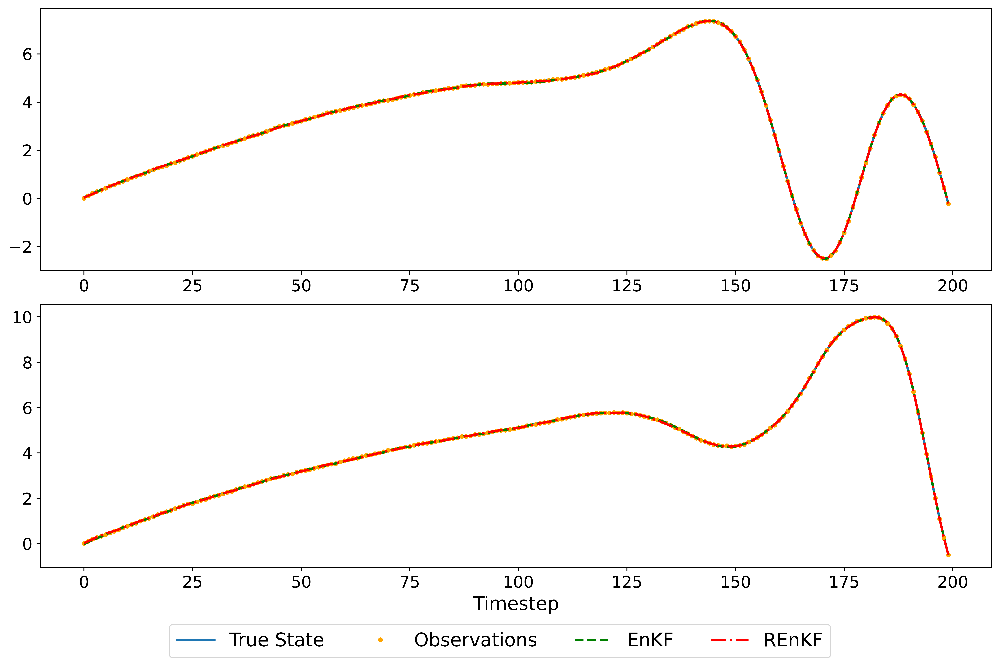

In [5]:
# Settings
np.random.seed(0)
T_END = 200
dt = 0.01
N_ENS = 21    # number of ensembles 
D_DIM = 42    # number of states
ALPHA = 1e-4

# Define observation model and its noise covariance matrix - linear full observation
H = np.eye(D_DIM)
GAMMA = np.eye(D_DIM) * ALPHA
# Define dynamics noise covariance matrix
XI = np.eye(D_DIM) * ALPHA
# Generate synthetic true state and observations
x_true = np.zeros((T_END, D_DIM))
x_obs = np.zeros((T_END, D_DIM))
# Define initial mean and covariance
X_INIT = np.zeros(D_DIM)
SIGMA_INIT = np.eye(D_DIM) * 1.1 * ALPHA
x_true[0] = np.random.multivariate_normal(X_INIT, SIGMA_INIT)
x_obs[0] = x_true[0] + np.random.multivariate_normal(np.zeros(D_DIM), GAMMA)
for t in range(1, T_END):
    x_true[t] = lorenz_96(x_true[t - 1], dt, xi=XI)
    x_obs[t] = x_true[t] + np.random.multivariate_normal(np.zeros(D_DIM), GAMMA)
# Initialize ensemble members for EnKF and REnKF
ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
# Initialize state estimates for EnKF and REnKF
state_estimates_EnKF = np.zeros((T_END, D_DIM))
state_estimates_REnKF = np.zeros((T_END, D_DIM))
# Initialize arrays to store ensemble members of each time step
ensemble_EnKF_list = np.zeros((T_END, N_ENS, D_DIM))
ensemble_REnKF_list = np.zeros((T_END, N_ENS, D_DIM))

for t in range(T_END):
    # Run EnKF and REnKF
    ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
    ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
    # Store ensemble members for each time step
    ensemble_EnKF_list[t] = ensemble_EnKF
    ensemble_REnKF_list[t] = ensemble_REnKF
    # Store ensemble mean as state estimate for EnKF and REnKF
    state_estimates_EnKF[t] = np.mean(ensemble_EnKF, axis=0)
    state_estimates_REnKF[t] = np.mean(ensemble_REnKF, axis=0)

# Compute the standard deviation of the ensemble for each time step for both methods
std_devs_EnKF = np.std(ensemble_EnKF_list, axis=1)
std_devs_REnKF = np.std(ensemble_REnKF_list, axis=1)

# Define the plot helper function
def plot_results(state_estimates_EnKF, state_estimates_REnKF, std_devs_EnKF, std_devs_REnKF, x_true, x_obs, variables):
    T_END = state_estimates_EnKF.shape[0]
    timesteps = np.arange(T_END)
    fig, axs = plt.subplots(len(variables), 1, figsize=(12, 4*len(variables)), dpi=600)
    for i, var in enumerate(variables):
        ax = axs[i]
        ax.plot(timesteps, x_true[:, var], '-', label='True State', lw=2)
        ax.plot(timesteps, x_obs[:, var], '.', label='Observations', color='orange')
        ax.plot(timesteps, state_estimates_EnKF[:, var], '--', label='EnKF', color='green', lw=2)
        ax.fill_between(timesteps, state_estimates_EnKF[:, var] - 1.96*std_devs_EnKF[:, var],
                         state_estimates_EnKF[:, var] + 1.96*std_devs_EnKF[:, var], alpha=0.3, color='green')
        ax.plot(timesteps, state_estimates_REnKF[:, var], '-.', label='REnKF', color='red', lw=2)
        ax.fill_between(timesteps, state_estimates_REnKF[:, var] - 1.96*std_devs_REnKF[:, var],
                         state_estimates_REnKF[:, var] + 1.96*std_devs_REnKF[:, var], alpha=0.25, color='red')
        ax.tick_params(axis='both', labelsize=14)
        if i == len(variables)-1:
            ax.set_xlabel('Timestep', fontsize=16)

    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=4, fontsize=16)
    fig.tight_layout()
    fig.subplots_adjust(bottom=0.15)
    plt.show()

plot_results(state_estimates_EnKF, state_estimates_REnKF, std_devs_EnKF, std_devs_REnKF, x_true, x_obs, variables=[0,2])

In [7]:
def run_nonlinear_experiment(N_ENS, M=100, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs,
 GAMMA=GAMMA, XI=XI, D_DIM=D_DIM, lorenz_96=lorenz_96, H=H, dt=dt, T_END=T_END):
    # Helper function for calculation of L96 table
    # Create arrays to store the results of each iteration
    ensemble_mean_error_EnKF_list = np.zeros(M)
    ensemble_mean_error_REnKF_list = np.zeros(M)
    average_CI_width_EnKF_list = np.zeros(M)
    average_CI_width_REnKF_list = np.zeros(M)
    percentage_in_CI_EnKF_list = np.zeros(M)
    percentage_in_CI_REnKF_list = np.zeros(M)

    for iter in range(M):
        np.random.seed(iter)
        # Initialize ensemble members for EnKF and REnKF
        ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
        ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
        # Initialize state estimates and covariance estimates for EnKF, and REnKF
        state_estimates_EnKF = np.zeros((T_END, D_DIM))
        state_estimates_REnKF = np.zeros((T_END, D_DIM))
        # Initialize mean error of EnKF and REnKF
        ensemble_mean_error_EnKF = np.zeros(T_END)
        ensemble_mean_error_REnKF = np.zeros(T_END)
        # Initialize arrays to store ensemble members of each time step
        ensemble_EnKF_list = np.zeros((T_END, N_ENS, D_DIM))
        ensemble_REnKF_list = np.zeros((T_END, N_ENS, D_DIM))

        for t in range(T_END):
            # Run EnKF and REnKF
            ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            # Store ensemble members for each time step
            ensemble_EnKF_list[t] = ensemble_EnKF
            ensemble_REnKF_list[t] = ensemble_REnKF
            # Store ensemble mean as state estimate for EnKF and REnKF
            state_estimates_EnKF[t] = np.mean(ensemble_EnKF, axis=0)
            state_estimates_REnKF[t] = np.mean(ensemble_REnKF, axis=0)
            # Compute the mean error of EnKF and REnKF compared to synthetic true state
            ensemble_mean_error_EnKF[t] = np.linalg.norm((state_estimates_EnKF[t] - x_true[t]))
            ensemble_mean_error_REnKF[t] = np.linalg.norm((state_estimates_REnKF[t] - x_true[t]))

        # Compute average mean errors across all time steps
        ensemble_mean_error_EnKF_list[iter] = np.mean(ensemble_mean_error_EnKF)
        ensemble_mean_error_REnKF_list[iter] = np.mean(ensemble_mean_error_REnKF)
        # Compute the standard deviation of the ensemble for each time step for EnKF and REnKF
        std_devs_EnKF = np.std(ensemble_EnKF_list, axis=1)
        std_devs_REnKF = np.std(ensemble_REnKF_list, axis=1)
        # Compute confidence interval for each time step and method
        widths_EnKF = 1.96 * 2 * std_devs_EnKF
        widths_REnKF = 1.96 * 2 * std_devs_REnKF
        # Compute average width of confidence intervals for each method
        average_width_EnKF = np.mean(widths_EnKF, axis=0)
        average_width_REnKF = np.mean(widths_REnKF, axis=0)
        # Compute average width of confidence intervals across all dimensions
        average_CI_width_EnKF_list[iter] = np.mean(average_width_EnKF)
        average_CI_width_REnKF_list[iter] = np.mean(average_width_REnKF)
        # Calculate coverages for EnKF
        mask_EnKF = (x_true >= (state_estimates_EnKF - 1.96*std_devs_EnKF)) & (x_true <= (state_estimates_EnKF +
         1.96*std_devs_EnKF))
        percentage_in_CI_EnKF = np.mean(mask_EnKF) * 100
        percentage_in_CI_EnKF_list[iter] = percentage_in_CI_EnKF
        # Calculate coverages for REnKF
        mask_REnKF = (x_true >= (state_estimates_REnKF - 1.96*std_devs_REnKF)) & (x_true <= (state_estimates_REnKF + 
        1.96*std_devs_REnKF))
        percentage_in_CI_REnKF = np.mean(mask_REnKF) * 100
        percentage_in_CI_REnKF_list[iter] = percentage_in_CI_REnKF

    print("Averaged EnKF Mean Error over 100 Monte-Carlo Trials:", np.mean(ensemble_mean_error_EnKF_list))
    print("Averaged REnKF Mean Error over 100 Monte-Carlo Trials", np.mean(ensemble_mean_error_REnKF_list))
    print()
    print("Averaged EnKF C.I. Width over 100 Monte-Carlo Trials", np.mean(average_CI_width_EnKF_list))
    print("Averaged REnKF C.I. Width over 100 Monte-Carlo Trials", np.mean(average_CI_width_REnKF_list))
    print()
    print("Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials", np.mean(percentage_in_CI_EnKF_list))
    print("Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials", np.mean(percentage_in_CI_REnKF_list))

#### Calculation for Small Noise + N=21 + Full Observation
(code for Table 5 in the paper)

In [8]:
run_nonlinear_experiment(N_ENS=21, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs, GAMMA=GAMMA, XI=XI, H=H)

Averaged EnKF Mean Error over 100 Monte-Carlo Trials: 0.10110719965434646
Averaged REnKF Mean Error over 100 Monte-Carlo Trials 0.10155587509766907

Averaged EnKF C.I. Width over 100 Monte-Carlo Trials 0.020828540490316905
Averaged REnKF C.I. Width over 100 Monte-Carlo Trials 0.020476543534177414

Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 50.240595238095246
Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 49.06833333333333


#### Calculation for Small Noise + N=84 + Full Observation
(code for Table 5 in the paper)

In [10]:
run_nonlinear_experiment(N_ENS=84, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs, GAMMA=GAMMA, XI=XI, H=H)

Averaged EnKF Mean Error over 100 Monte-Carlo Trials: 0.058164039443760716
Averaged REnKF Mean Error over 100 Monte-Carlo Trials 0.05896921777802122

Averaged EnKF C.I. Width over 100 Monte-Carlo Trials 0.028132075791052605
Averaged REnKF C.I. Width over 100 Monte-Carlo Trials 0.027851674044031115

Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 87.9575
Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 86.79833333333332


### Moderate Noise $\alpha = 10^{-2}$

#### Visualization of first and thrid ($u(1)$ and  $u(3)$) dimensions for 1 Monte-Carlo Trial for Moderate Noise $\alpha = 10^{-2}$
(supplementary results of Figure 4 in the paper)

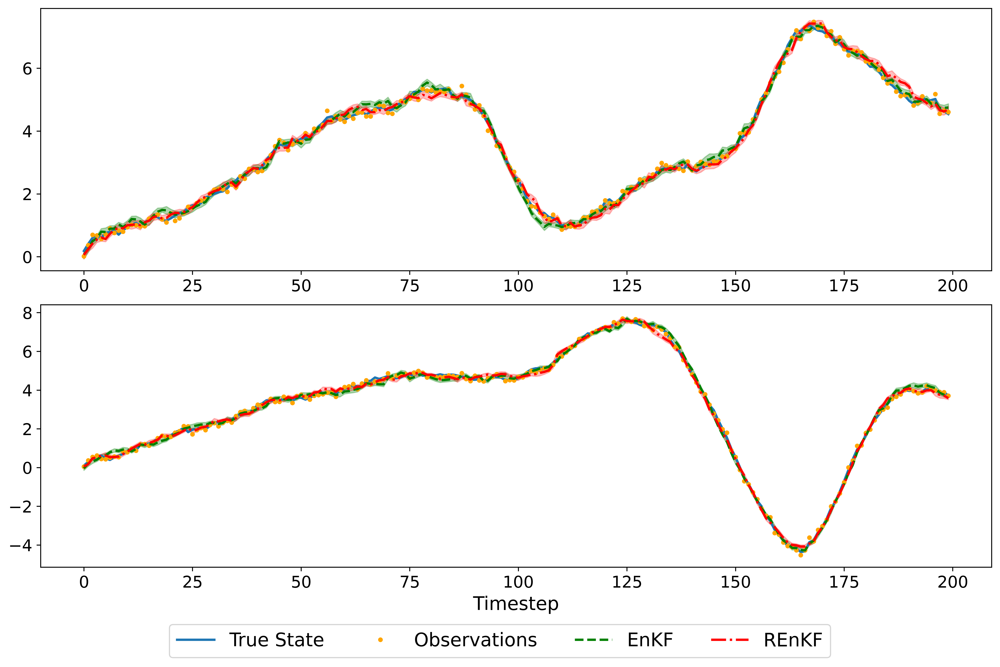

In [6]:
# Settings
np.random.seed(0)
T_END = 200
dt = 0.01
N_ENS = 21    # number of ensembles 
D_DIM = 42    # number of states
ALPHA = 0.01

# Define observation model and its noise covariance matrix - linear full observation
H = np.eye(D_DIM)
GAMMA = np.eye(D_DIM) * ALPHA
# Define dynamics noise covariance matrix
XI = np.eye(D_DIM) * ALPHA
# Generate synthetic true state and observations
x_true = np.zeros((T_END, D_DIM))
x_obs = np.zeros((T_END, D_DIM))
# Define initial mean and covariance
X_INIT = np.zeros(D_DIM)
SIGMA_INIT = np.eye(D_DIM) * 1.1 * ALPHA
x_true[0] = np.random.multivariate_normal(X_INIT, SIGMA_INIT)
x_obs[0] = x_true[0] + np.random.multivariate_normal(np.zeros(D_DIM), GAMMA)
for t in range(1, T_END):
    x_true[t] = lorenz_96(x_true[t - 1], dt, xi=XI)
    x_obs[t] = x_true[t] + np.random.multivariate_normal(np.zeros(D_DIM), GAMMA)
# Initialize ensemble members for EnKF and REnKF
ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
# Initialize state estimates for EnKF and REnKF
state_estimates_EnKF = np.zeros((T_END, D_DIM))
state_estimates_REnKF = np.zeros((T_END, D_DIM))
# Initialize arrays to store ensemble members of each time step
ensemble_EnKF_list = np.zeros((T_END, N_ENS, D_DIM))
ensemble_REnKF_list = np.zeros((T_END, N_ENS, D_DIM))

for t in range(T_END):
    # Run EnKF and REnKF
    ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
    ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
    # Store ensemble members for each time step
    ensemble_EnKF_list[t] = ensemble_EnKF
    ensemble_REnKF_list[t] = ensemble_REnKF
    # Store ensemble mean as state estimate for EnKF and REnKF
    state_estimates_EnKF[t] = np.mean(ensemble_EnKF, axis=0)
    state_estimates_REnKF[t] = np.mean(ensemble_REnKF, axis=0)

# Compute the standard deviation of the ensemble for each time step for both methods
std_devs_EnKF = np.std(ensemble_EnKF_list, axis=1)
std_devs_REnKF = np.std(ensemble_REnKF_list, axis=1)
plot_results(state_estimates_EnKF, state_estimates_REnKF, std_devs_EnKF, std_devs_REnKF, x_true, x_obs, variables=[0,2])

#### Calculation for Moderate Noise + N=21 + Full Observation
(code for Table 5 in the paper)

In [12]:
run_nonlinear_experiment(N_ENS=21, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs, GAMMA=GAMMA, XI=XI, H=H)

Averaged EnKF Mean Error over 100 Monte-Carlo Trials: 0.9572630364193145
Averaged REnKF Mean Error over 100 Monte-Carlo Trials 0.9616069524558395

Averaged EnKF C.I. Width over 100 Monte-Carlo Trials 0.20827537339488272
Averaged REnKF C.I. Width over 100 Monte-Carlo Trials 0.20474662960063283

Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 51.55059523809525
Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 50.34488095238095


#### Calculation for Moderate Noise + N=84 + Full Observation
(code for Table 5 in the paper)

In [14]:
run_nonlinear_experiment(N_ENS=84, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs, GAMMA=GAMMA, XI=XI, H=H)

Averaged EnKF Mean Error over 100 Monte-Carlo Trials: 0.5681714353344863
Averaged REnKF Mean Error over 100 Monte-Carlo Trials 0.5759965689469467

Averaged EnKF C.I. Width over 100 Monte-Carlo Trials 0.2813033750724045
Averaged REnKF C.I. Width over 100 Monte-Carlo Trials 0.27849268685604206

Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 88.60773809523809
Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 87.51940476190477


### Large Noise $\alpha = 10^{-1}$

#### Visualization of first and thrid ($u(1)$ and  $u(3)$) dimensions for 1 Monte-Carlo Trial for Large Noise $\alpha = 10^{-1}$
(supplementary results of Figure 4 in the paper)

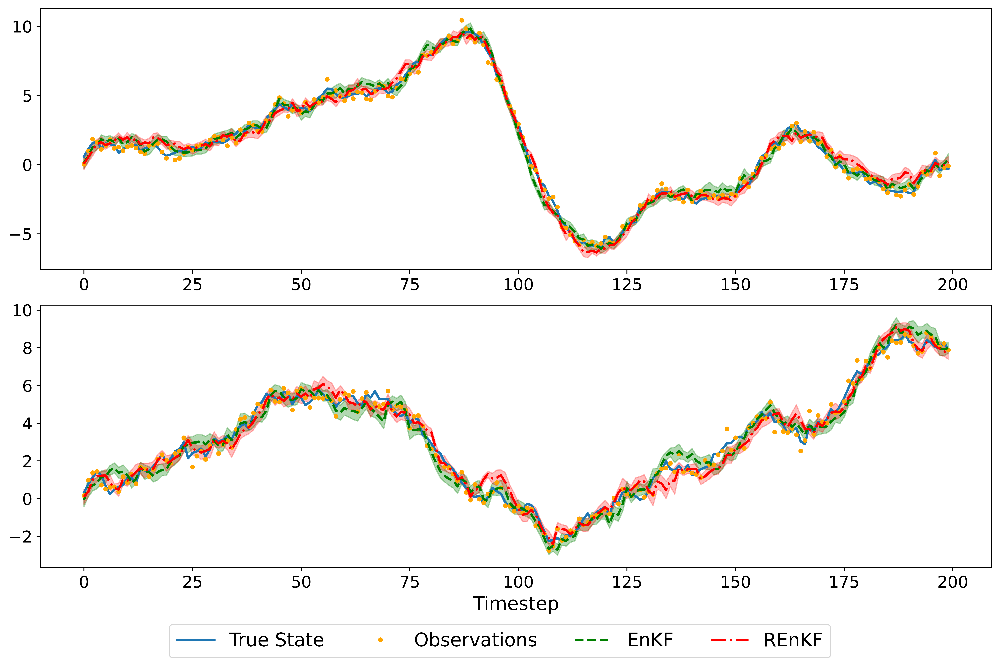

In [7]:
# Settings
np.random.seed(0)
T_END = 200
dt = 0.01
N_ENS = 21    # number of ensembles 
D_DIM = 42    # number of states
ALPHA = 0.1

# Define observation model and its noise covariance matrix - linear full observation
H = np.eye(D_DIM)
GAMMA = np.eye(D_DIM) * ALPHA
# Define dynamics noise covariance matrix
XI = np.eye(D_DIM) * ALPHA
# Generate synthetic true state and observations
x_true = np.zeros((T_END, D_DIM))
x_obs = np.zeros((T_END, D_DIM))
# Define initial mean and covariance
X_INIT = np.zeros(D_DIM)
SIGMA_INIT = np.eye(D_DIM) * 1.1 * ALPHA
x_true[0] = np.random.multivariate_normal(X_INIT, SIGMA_INIT)
x_obs[0] = x_true[0] + np.random.multivariate_normal(np.zeros(D_DIM), GAMMA)
for t in range(1, T_END):
    x_true[t] = lorenz_96(x_true[t - 1], dt, xi=XI)
    x_obs[t] = x_true[t] + np.random.multivariate_normal(np.zeros(D_DIM), GAMMA)
# Initialize ensemble members for EnKF and REnKF
ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
# Initialize state estimates for EnKF and REnKF
state_estimates_EnKF = np.zeros((T_END, D_DIM))
state_estimates_REnKF = np.zeros((T_END, D_DIM))
# Initialize arrays to store ensemble members of each time step
ensemble_EnKF_list = np.zeros((T_END, N_ENS, D_DIM))
ensemble_REnKF_list = np.zeros((T_END, N_ENS, D_DIM))

for t in range(T_END):
    # Run EnKF and REnKF
    ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
    ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
    # Store ensemble members for each time step
    ensemble_EnKF_list[t] = ensemble_EnKF
    ensemble_REnKF_list[t] = ensemble_REnKF
    # Store ensemble mean as state estimate for EnKF and REnKF
    state_estimates_EnKF[t] = np.mean(ensemble_EnKF, axis=0)
    state_estimates_REnKF[t] = np.mean(ensemble_REnKF, axis=0)

# Compute the standard deviation of the ensemble for each time step for both methods
std_devs_EnKF = np.std(ensemble_EnKF_list, axis=1)
std_devs_REnKF = np.std(ensemble_REnKF_list, axis=1)
plot_results(state_estimates_EnKF, state_estimates_REnKF, std_devs_EnKF, std_devs_REnKF, x_true, x_obs, variables=[0,2])

#### Calculation for Large Noise + N=21 + Full Observation
(code for Table 5 in the paper)

In [16]:
run_nonlinear_experiment(N_ENS=21, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs, GAMMA=GAMMA, XI=XI, H=H)

Averaged EnKF Mean Error over 100 Monte-Carlo Trials: 3.0231257645250533
Averaged REnKF Mean Error over 100 Monte-Carlo Trials 3.0334548446406857

Averaged EnKF C.I. Width over 100 Monte-Carlo Trials 0.6586169404373277
Averaged REnKF C.I. Width over 100 Monte-Carlo Trials 0.6475351357089285

Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 51.613928571428566
Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 50.44392857142858


#### Calculation for Large Noise + N=84 + Full Observation
(code for Table 5 in the paper)

In [18]:
run_nonlinear_experiment(N_ENS=84, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs, GAMMA=GAMMA, XI=XI, H=H)

Averaged EnKF Mean Error over 100 Monte-Carlo Trials: 1.7971037484312378
Averaged REnKF Mean Error over 100 Monte-Carlo Trials 1.821845169077251

Averaged EnKF C.I. Width over 100 Monte-Carlo Trials 0.8895479055796964
Averaged REnKF C.I. Width over 100 Monte-Carlo Trials 0.880634077977373

Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 88.61011904761905
Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 87.51607142857144


## EnKF / REnKF for Lorenz 96 Dynamics Setting with Partial Observation

This section contains the code used to compute the Partial Observation cases in Table 5, generating Figure 4, and the supplementary results related to Figure 4, as described in the paper. For each experiment in Table 5 we run each algorithm M = 100 times and report the average value of the three metrics. More details can be found in Appendix A.1. of the paper.
The metrics mean error, confidence interval (C.I.) width, and confidence interval (C.I.) coverage descriptions can also be found in Appendix A.1 of the paper.

- observation time: $J=200$ with $\Delta t=0.01$; &nbsp; fixed ensemble size $N=21/84$ &nbsp; fixed state dimension $d=42$
- small noise level $\alpha=10^{-4}$, &nbsp; moderate noise level $\alpha=10^{-2}$, &nbsp; and large noise level $\alpha=10^{-1}$
- initial distribution: $u^{(0)} \sim \mathcal{N}(\mathbf{0}, \Sigma^{(0)});$ &nbsp; $\Sigma^{(0)} =  1.1 \alpha \times I_{42}$
- dynamics model: $u^{(j)} = \Psi(u^{(j-1)}) + \xi^{(j)}$
    - linear dynamics: $\Psi$ represents the $\Delta t$-flow of the Lorenz 96 equations, the detailed description can be found in 4.2 of the paper. (Note: Python uses 0-based indexing, whereas the mathematical formulation in the paper uses 1-based indexing.)
where the forcing constant $F$ is set at 8
    - gaussian noise $\xi^{(j)} \overset{\mathrm{iid}}{\sim} \mathcal{N}(0, \Xi)$; &nbsp; $\Xi = \alpha \times I_{42}$
- observation model: $y^{(j)} = Hu^{(j)} + \eta^{(j)}$
    - linear partial observation: only 2 out of every 3 components of the state are observed, $H \in \R^{{\frac{2d}{3}} \times d}$, which corresponds to $I_{d}$ with every 3rd row removed
    - gaussian noise $\eta^{(j)} \overset{\mathrm{iid}}{\sim} \mathcal{N}(0, \Gamma)$; &nbsp; $\Gamma = \alpha \times I_{28}$ because of the reduced number of observed variables

### Small Noise $\alpha = 10^{-4}$

#### Visualization of first and thrid ($u(1)$ and  $u(3)$) dimensions for 1 Monte-Carlo Trial for Small Noise $\alpha = 10^{-4}$
(code for Figure 4 in the paper)

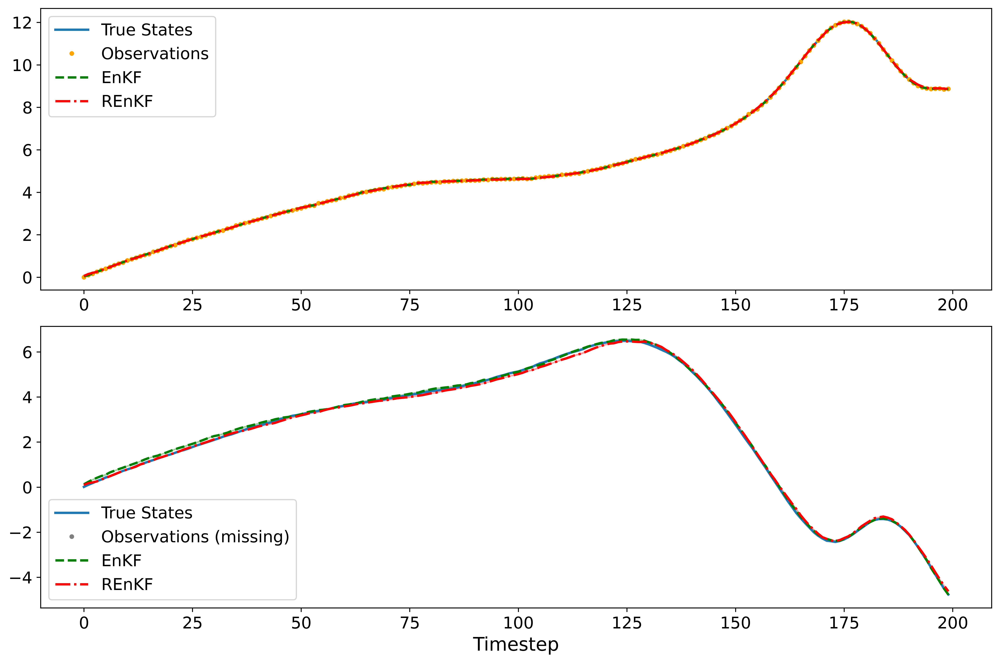

In [8]:
# Settings
np.random.seed(0)
T_END = 200
dt = 0.01
N_ENS = 21    # number of ensembles 
D_DIM = 42    # number of states
ALPHA = 1e-4

# Define observation model and its noise covariance matrix - linear partial observation
observed_variables_index = np.array([i for i in range(1, D_DIM + 1) if i % 3 != 0]) - 1
H = np.zeros((len(observed_variables_index), D_DIM))
for i, idx in enumerate(observed_variables_index):
    H[i, idx] = 1
GAMMA = np.eye(len(observed_variables_index)) * ALPHA
# Define dynamics noise covariance matrix
XI = np.eye(D_DIM) * ALPHA
# Generate synthetic true state and observations
x_true = np.zeros((T_END, D_DIM))
x_obs = np.zeros((T_END, len(observed_variables_index))) 
# Define initial mean and covariance
X_INIT = np.zeros(D_DIM)
SIGMA_INIT = np.eye(D_DIM) * 1.1 * ALPHA
x_true[0] = np.random.multivariate_normal(X_INIT, SIGMA_INIT)
x_obs[0] = x_true[0, observed_variables_index] + np.random.multivariate_normal(np.zeros(len(observed_variables_index)), GAMMA)
for t in range(1, T_END):
    x_true[t] = lorenz_96(x_true[t - 1], dt, xi=XI)
    x_obs[t] = x_true[t, observed_variables_index] + np.random.multivariate_normal(np.zeros(len(observed_variables_index)), GAMMA)

# Initialize ensemble members for EnKF and REnKF
ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
# Initialize state estimates for EnKF and REnKF
state_estimates = np.zeros((T_END, D_DIM))
state_estimates_REnKF = np.zeros((T_END, D_DIM))
# Initialize state estimates for EnKF and REnKF
state_estimates_EnKF = np.zeros((T_END, D_DIM))
state_estimates_REnKF = np.zeros((T_END, D_DIM))
# Initialize arrays to store ensemble members of each time step
ensemble_EnKF_list = np.zeros((T_END, N_ENS, D_DIM))
ensemble_REnKF_list = np.zeros((T_END, N_ENS, D_DIM))

for t in range(T_END):
    # Run EnKF and REnKF
    ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
    ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
    # Store ensemble members for each time step
    ensemble_EnKF_list[t] = ensemble_EnKF
    ensemble_REnKF_list[t] = ensemble_REnKF
    # Store ensemble mean as state estimate for EnKF and REnKF
    state_estimates_EnKF[t] = np.mean(ensemble_EnKF, axis=0)
    state_estimates_REnKF[t] = np.mean(ensemble_REnKF, axis=0)

# Compute the standard deviation of the ensemble for each time step for both methods
std_devs_EnKF = np.std(ensemble_EnKF_list, axis=1)
std_devs_REnKF = np.std(ensemble_REnKF_list, axis=1)

# Define the plot helper function
def plot_results_partial_obs(state_estimates_EnKF, state_estimates_REnKF, std_devs_EnKF, std_devs_REnKF, x_true,
                                 x_obs, variables):
    T_END = state_estimates_EnKF.shape[0]
    timesteps = np.arange(T_END)
    fig, axes = plt.subplots(len(variables), 1, figsize=(12, 4*len(variables)), dpi=600)
    for i, ax in enumerate(axes):
        var_idx = variables[i]
        ax.plot(timesteps, x_true[:, var_idx], label='True States', lw=2)
        if var_idx in observed_variables_index:
            obs_idx = np.where(observed_variables_index == var_idx)[0][0]
            ax.plot(timesteps, x_obs[:, obs_idx], '.', label='Observations', color='orange')
        else:
            ax.plot([], [], '.', label='Observations (missing)', color='gray')    
        ax.plot(timesteps, state_estimates_EnKF[:, var_idx], '--', label='EnKF', lw=2, color='green')
        ax.fill_between(timesteps, state_estimates_EnKF[:, var_idx] - 1.96*std_devs_EnKF[:, var_idx],
            state_estimates_EnKF[:, var_idx] + 1.96*std_devs_EnKF[:, var_idx], color='green', alpha=0.25)
        ax.plot(timesteps, state_estimates_REnKF[:, var_idx],'-.', label='REnKF', lw=2, color='red')
        ax.fill_between(timesteps, state_estimates_REnKF[:, var_idx] - 1.96*std_devs_REnKF[:, var_idx], 
            state_estimates_REnKF[:, var_idx] + 1.96*std_devs_REnKF[:, var_idx], color='red', alpha=0.25)
        ax.tick_params(axis='both', labelsize=14)
        if i == len(variables)-1:
            ax.set_xlabel('Timestep', fontsize=16)
        ax.legend(fontsize=14, loc='best')
    plt.tight_layout()
    plt.show()

plot_results_partial_obs(state_estimates_EnKF, state_estimates_REnKF, std_devs_EnKF, std_devs_REnKF, x_true,
 x_obs, variables=[0,2])

#### Calculation for Small Noise + N=21 + Partial Observation
(code for Table 5 in the paper)

In [33]:
run_nonlinear_experiment(N_ENS=21, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs, GAMMA=GAMMA, XI=XI, H=H)

Averaged EnKF Mean Error over 100 Monte-Carlo Trials: 0.4063923124388718
Averaged REnKF Mean Error over 100 Monte-Carlo Trials 0.4070821799745993

Averaged EnKF C.I. Width over 100 Monte-Carlo Trials 0.02659763720662669
Averaged REnKF C.I. Width over 100 Monte-Carlo Trials 0.025827815884199544

Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 39.623095238095246
Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 38.249761904761904


#### Calculation for Small Noise + N=84 + Partial Observation
(code for Table 5 in the paper)

In [35]:
run_nonlinear_experiment(N_ENS=84, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs, GAMMA=GAMMA, XI=XI, H=H)

Averaged EnKF Mean Error over 100 Monte-Carlo Trials: 0.2919246916225442
Averaged REnKF Mean Error over 100 Monte-Carlo Trials 0.29774646008624334

Averaged EnKF C.I. Width over 100 Monte-Carlo Trials 0.04377426683151194
Averaged REnKF C.I. Width over 100 Monte-Carlo Trials 0.0411924352302831

Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 71.47142857142858
Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 69.245


### Moderate Noise $\alpha = 10^{-2}$

#### Visualization of first and thrid ($u(1)$ and  $u(3)$) dimensions for 1 Monte-Carlo Trial for Moderate Noise $\alpha = 10^{-2}$
(supplementary results of Figure 4 in the paper)

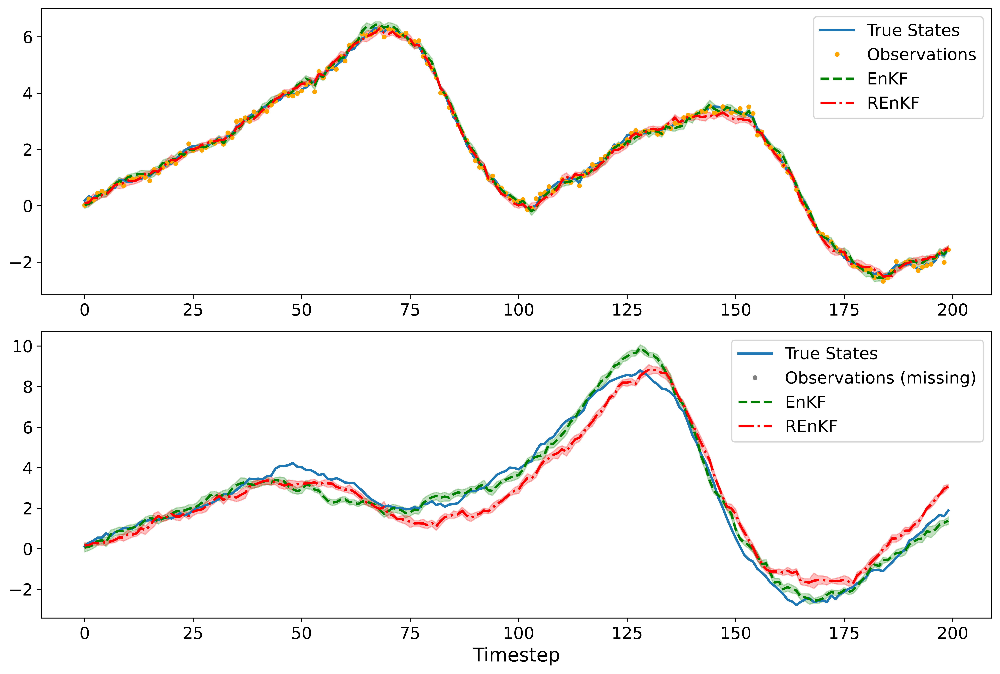

In [9]:
# Settings
np.random.seed(0)
T_END = 200
dt = 0.01
N_ENS = 21    # number of ensembles 
D_DIM = 42    # number of states
ALPHA = 0.01

# Define observation model and its noise covariance matrix - linear partial observation
observed_variables_index = np.array([i for i in range(1, D_DIM + 1) if i % 3 != 0]) - 1
H = np.zeros((len(observed_variables_index), D_DIM))
for i, idx in enumerate(observed_variables_index):
    H[i, idx] = 1
GAMMA = np.eye(len(observed_variables_index)) * ALPHA
# Define dynamics noise covariance matrix
XI = np.eye(D_DIM) * ALPHA
# Generate synthetic true state and observations
x_true = np.zeros((T_END, D_DIM))
x_obs = np.zeros((T_END, len(observed_variables_index))) 
# Define initial mean and covariance
X_INIT = np.zeros(D_DIM)
SIGMA_INIT = np.eye(D_DIM) * 1.1 * ALPHA
x_true[0] = np.random.multivariate_normal(X_INIT, SIGMA_INIT)
x_obs[0] = x_true[0, observed_variables_index] + np.random.multivariate_normal(np.zeros(len(observed_variables_index)), GAMMA)
for t in range(1, T_END):
    x_true[t] = lorenz_96(x_true[t - 1], dt, xi=XI)
    x_obs[t] = x_true[t, observed_variables_index] + np.random.multivariate_normal(np.zeros(len(observed_variables_index)), GAMMA)

# Initialize ensemble members for EnKF and REnKF
ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
# Initialize state estimates for EnKF and REnKF
state_estimates = np.zeros((T_END, D_DIM))
state_estimates_REnKF = np.zeros((T_END, D_DIM))
# Initialize state estimates for EnKF and REnKF
state_estimates_EnKF = np.zeros((T_END, D_DIM))
state_estimates_REnKF = np.zeros((T_END, D_DIM))
# Initialize arrays to store ensemble members of each time step
ensemble_EnKF_list = np.zeros((T_END, N_ENS, D_DIM))
ensemble_REnKF_list = np.zeros((T_END, N_ENS, D_DIM))

for t in range(T_END):
    # Run EnKF and REnKF
    ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
    ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
    # Store ensemble members for each time step
    ensemble_EnKF_list[t] = ensemble_EnKF
    ensemble_REnKF_list[t] = ensemble_REnKF
    # Store ensemble mean as state estimate for EnKF and REnKF
    state_estimates_EnKF[t] = np.mean(ensemble_EnKF, axis=0)
    state_estimates_REnKF[t] = np.mean(ensemble_REnKF, axis=0)

# Compute the standard deviation of the ensemble for each time step for both methods
std_devs_EnKF = np.std(ensemble_EnKF_list, axis=1)
std_devs_REnKF = np.std(ensemble_REnKF_list, axis=1)
plot_results_partial_obs(state_estimates_EnKF, state_estimates_REnKF, std_devs_EnKF, std_devs_REnKF, x_true,
 x_obs, variables=[0,2])

#### Calculation for Moderate Noise + N=21 + Partial Observation
(code for Table 5 in the paper)

In [25]:
run_nonlinear_experiment(N_ENS=21, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs, GAMMA=GAMMA, XI=XI, H=H)

Averaged EnKF Mean Error over 100 Monte-Carlo Trials: 3.3882319385444966
Averaged REnKF Mean Error over 100 Monte-Carlo Trials 3.3564594435695447

Averaged EnKF C.I. Width over 100 Monte-Carlo Trials 0.2660028507980524
Averaged REnKF C.I. Width over 100 Monte-Carlo Trials 0.25838810277371294

Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 43.248571428571424
Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 42.041428571428575


#### Calculation for Moderate Noise + N=84 + Partial Observation
(code for Table 5 in the paper)

In [27]:
run_nonlinear_experiment(N_ENS=84, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs, GAMMA=GAMMA, XI=XI, H=H)

Averaged EnKF Mean Error over 100 Monte-Carlo Trials: 2.4180522617495286
Averaged REnKF Mean Error over 100 Monte-Carlo Trials 2.500425248261347

Averaged EnKF C.I. Width over 100 Monte-Carlo Trials 0.4383218732548552
Averaged REnKF C.I. Width over 100 Monte-Carlo Trials 0.4120349952376959

Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 75.31011904761904
Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 72.53595238095238


### Large Noise $\alpha = 10^{-1}$

#### Visualization of first and thrid ($u(1)$ and  $u(3)$) dimensions for 1 Monte-Carlo Trial for Large Noise $\alpha = 10^{-1}$
(supplementary results of Figure 4 in the paper)

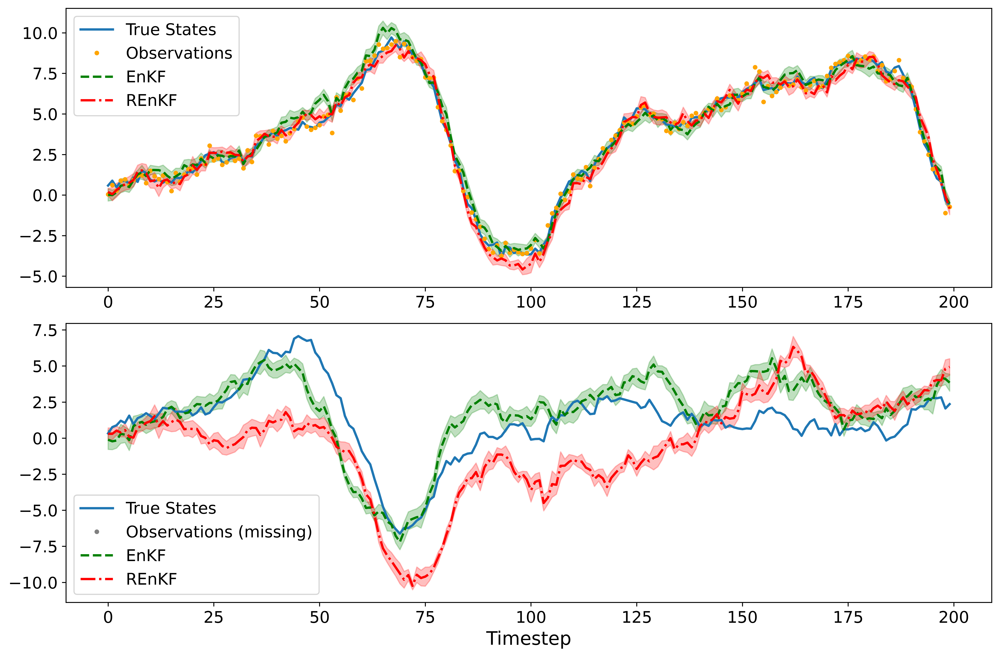

In [10]:
# Settings
np.random.seed(0)
T_END = 200
dt = 0.01
N_ENS = 21    # number of ensembles 
D_DIM = 42    # number of states
ALPHA = 0.1

# Define observation model and its noise covariance matrix - linear partial observation
observed_variables_index = np.array([i for i in range(1, D_DIM + 1) if i % 3 != 0]) - 1
H = np.zeros((len(observed_variables_index), D_DIM))
for i, idx in enumerate(observed_variables_index):
    H[i, idx] = 1
GAMMA = np.eye(len(observed_variables_index)) * ALPHA
# Define dynamics noise covariance matrix
XI = np.eye(D_DIM) * ALPHA
# Generate synthetic true state and observations
x_true = np.zeros((T_END, D_DIM))
x_obs = np.zeros((T_END, len(observed_variables_index))) 
# Define initial mean and covariance
X_INIT = np.zeros(D_DIM)
SIGMA_INIT = np.eye(D_DIM) * 1.1 * ALPHA
x_true[0] = np.random.multivariate_normal(X_INIT, SIGMA_INIT)
x_obs[0] = x_true[0, observed_variables_index] + np.random.multivariate_normal(np.zeros(len(observed_variables_index)), GAMMA)
for t in range(1, T_END):
    x_true[t] = lorenz_96(x_true[t - 1], dt, xi=XI)
    x_obs[t] = x_true[t, observed_variables_index] + np.random.multivariate_normal(np.zeros(len(observed_variables_index)), GAMMA)

# Initialize ensemble members for EnKF and REnKF
ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
# Initialize state estimates for EnKF and REnKF
state_estimates = np.zeros((T_END, D_DIM))
state_estimates_REnKF = np.zeros((T_END, D_DIM))
# Initialize state estimates for EnKF and REnKF
state_estimates_EnKF = np.zeros((T_END, D_DIM))
state_estimates_REnKF = np.zeros((T_END, D_DIM))
# Initialize arrays to store ensemble members of each time step
ensemble_EnKF_list = np.zeros((T_END, N_ENS, D_DIM))
ensemble_REnKF_list = np.zeros((T_END, N_ENS, D_DIM))

for t in range(T_END):
    # Run EnKF and REnKF
    ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
    ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
    # Store ensemble members for each time step
    ensemble_EnKF_list[t] = ensemble_EnKF
    ensemble_REnKF_list[t] = ensemble_REnKF
    # Store ensemble mean as state estimate for EnKF and REnKF
    state_estimates_EnKF[t] = np.mean(ensemble_EnKF, axis=0)
    state_estimates_REnKF[t] = np.mean(ensemble_REnKF, axis=0)

# Compute the standard deviation of the ensemble for each time step for both methods
std_devs_EnKF = np.std(ensemble_EnKF_list, axis=1)
std_devs_REnKF = np.std(ensemble_REnKF_list, axis=1)
plot_results_partial_obs(state_estimates_EnKF, state_estimates_REnKF, std_devs_EnKF, std_devs_REnKF, x_true,
 x_obs, variables=[0,2])

#### Calculation for Large Noise + N=21 + Partial Observation
(code for Table 5 in the paper)

In [29]:
run_nonlinear_experiment(N_ENS=21, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs, GAMMA=GAMMA, XI=XI, H=H)

Averaged EnKF Mean Error over 100 Monte-Carlo Trials: 10.592076195374426
Averaged REnKF Mean Error over 100 Monte-Carlo Trials 10.637875336656613

Averaged EnKF C.I. Width over 100 Monte-Carlo Trials 0.841169186599189
Averaged REnKF C.I. Width over 100 Monte-Carlo Trials 0.8167141180475354

Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 43.25916666666667
Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 41.86761904761904


#### Calculation for Large Noise + N=84 + Partial Observation
(code for Table 5 in the paper)

In [31]:
run_nonlinear_experiment(N_ENS=84, X_INIT=X_INIT, SIGMA_INIT=SIGMA_INIT, x_true=x_true, x_obs=x_obs, GAMMA=GAMMA, XI=XI, H=H)

Averaged EnKF Mean Error over 100 Monte-Carlo Trials: 7.628161487469572
Averaged REnKF Mean Error over 100 Monte-Carlo Trials 7.90109157387175

Averaged EnKF C.I. Width over 100 Monte-Carlo Trials 1.3861093654066696
Averaged REnKF C.I. Width over 100 Monte-Carlo Trials 1.3032647063915597

Averaged EnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 75.29523809523809
Averaged REnKF C.I. Coverage(%) over 100 Monte-Carlo Trials 72.61464285714287


## Code for Figure 5 in the paper

This figure contains six parts: Full Observation (1,2,3) & Partial Observation (4,5,6)

Part 1 Mean Error ($\mathsf{E}_{\text {\tiny L96}}$) vs. Noise Level ($\alpha$) with Full Observation
- observation time: $J=200$ with $\Delta t=0.01$; &nbsp; fixed ensemble size $N=20$
- noise level $\alpha$: 15 evenly spaced numbers between $10^{-16}$ and 1
- initial distribution: $u^{(0)} \sim \mathcal{N}(\mathbf{0}, \Sigma^{(0)});$ &nbsp; $\Sigma^{(0)} = 10^{-8} \times I_{42}$  for all $\alpha$
- dynamics model: $u^{(j)} = \Psi(u^{(j-1)}) + \xi^{(j)}$
    - Lorenz-96 with F=8, d=42
    - gaussian noise $\xi^{(j)} \overset{\mathrm{iid}}{\sim} \mathcal{N}(0, \Xi)$; &nbsp; $\Xi = \alpha \times I_{42}$
- observation model: $y^{(j)} = Hu^{(j)} + \eta^{(j)}$
    - linear full observation $H = I_{42}$
    - gaussian noise $\eta^{(j)} \overset{\mathrm{iid}}{\sim} \mathcal{N}(0, \Gamma)$; &nbsp; $\Gamma = \alpha \times I_{42}$

Part 2 Mean Error ($\mathsf{E}_{\text {\tiny L96}}$) vs. Ensemble Size ($N$) with Full Observation
- observation time: $J=200$ with $\Delta t=0.01$; &nbsp; fixed $\alpha = 10^{-4}$
- ensemble size $N$ =[10, 20, .., 90, 100]
- initial distribution: $u^{(0)} \sim \mathcal{N}(\mathbf{0}, \Sigma^{(0)});$ &nbsp; $\Sigma^{(0)} = 1.1 \alpha \times I_{42}$
- dynamics model: $u^{(j)} = \Psi(u^{(j-1)}) + \xi^{(j)}$
    - Lorenz-96 with F=8, d=42
    - gaussian noise $\xi^{(j)} \overset{\mathrm{iid}}{\sim} \mathcal{N}(0, \Xi)$; &nbsp; $\Xi = \alpha \times I_{42}$
- observation model: $y^{(j)} = Hu^{(j)} + \eta^{(j)}$
    - linear full observation $H = I_{42}$
    - gaussian noise $\eta^{(j)} \overset{\mathrm{iid}}{\sim} \mathcal{N}(0, \Gamma)$; &nbsp; $\Gamma = \alpha \times I_{42}$

Part 3 Mean Error ($\mathsf{E}_{\text {\tiny L96}}$) vs. State Dimension ($d$) with Full Observation
- observation time: $J=200$ with $\Delta t=0.01$; &nbsp; fixed $\alpha = 10^{-4}$; &nbsp; fixed $N=20$
- state dimension $d$ = [6, 18, 30, 42, 54, 66, 78, 90, 102, 114] which are 3*[2, 6, 10, 14, 18, 22, 26, 30, 34, 38]
- initial distribution: $u^{(0)} \sim \mathcal{N}(\mathbf{0}, \Sigma^{(0)});$ &nbsp; $\Sigma^{(0)} = 1.1 \alpha \times I_{d}$
- dynamics model: $u^{(j)} = \Psi(u^{(j-1)}) + \xi^{(j)}$
    - Lorenz-96 with F=8, d varies
    - gaussian noise $\xi^{(j)} \overset{\mathrm{iid}}{\sim} \mathcal{N}(0, \Xi)$; &nbsp; $\Xi = \alpha \times I_{d}$
- observation model: $y^{(j)} = Hu^{(j)} + \eta^{(j)}$
    - linear full observation $H = I_{d}$
    - gaussian noise $\eta^{(j)} \overset{\mathrm{iid}}{\sim} \mathcal{N}(0, \Gamma)$; &nbsp; $\Gamma = \alpha \times I_{d}$

Part 4/5/6 have the same setup as Part 1/2/3 except:
- linear partial observation: only 2 out of every 3 components of the state are observed, $H \in \R^{{\frac{2d}{3}} \times d}$, which corresponds to $I_{d}$ with every 3rd row removed
 - gaussian noise $\eta^{(j)} \overset{\mathrm{iid}}{\sim} \mathcal{N}(0, \Gamma)$; &nbsp; $\Gamma = \alpha \times I_{\frac{2d}{3}}$ because of the reduced number of observed variables

The results in this figure are averaged over M = 10 runs of the algorithms, see section 4.2 and Appendix A.1 of the paper for further details.

In [ ]:
# Settings
np.random.seed(0)
T_END = 200
dt = 0.01
M = 10  # number of total runs

##### Part 1 Mean Error vs. Noise Level with Full Observation #####
D_DIM = 42    # number of states
N_ENS = 20  # number of ensembles 
ALPHA_LEVELS = np.linspace(1e-16, 0.1, 15)
# Define observation matrix for linear full observation
H = np.eye(D_DIM)
# Define arrays for storing the average mean error for EnKF and REnKF for all noise levels
avg_error_EnKF = np.zeros(len(ALPHA_LEVELS))
avg_error_REnKF = np.zeros(len(ALPHA_LEVELS))
for i, alpha in enumerate(ALPHA_LEVELS):
    # Define noise covariance matrix for full observation
    GAMMA = np.eye(D_DIM) * alpha
    XI = np.eye(D_DIM) * alpha
    # Initialize the sums of mean error
    error_sum_EnKF = 0
    error_sum_REnKF = 0
    for run in range(M):
        # Generate synthetic true state and observations
        x_true = np.zeros((T_END, D_DIM))
        x_obs = np.zeros((T_END, D_DIM))
        # Define initial mean and covariance
        X_INIT = np.zeros(D_DIM)
        SIGMA_INIT = np.eye(D_DIM) * 1e-8
        x_true[0] = np.random.multivariate_normal(X_INIT, SIGMA_INIT)
        x_obs[0] = x_true[0] + np.random.multivariate_normal(np.zeros(D_DIM), GAMMA)
        for t in range(1, T_END):
            x_true[t] = lorenz_96(x_true[t - 1], dt, xi=XI)
            x_obs[t] = x_true[t] + np.random.multivariate_normal(np.zeros(D_DIM), GAMMA)
        # Initialize ensemble for EnKF and REnKF
        ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
        ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
        for t in range(T_END):
            # Perform ensemble prediction and analysis steps for both methods
            ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            # Compute the mean error for the current state estimate for both methods
            error_EnKF = np.linalg.norm(np.mean(ensemble_EnKF, axis=0) - x_true[t])
            error_REnKF = np.linalg.norm(np.mean(ensemble_REnKF, axis=0) - x_true[t])
            # Accumulate mean errors
            error_sum_EnKF += error_EnKF
            error_sum_REnKF += error_REnKF
    # Calculate the average mean error for both methods
    avg_error_EnKF[i] = error_sum_EnKF / (M * T_END)
    avg_error_REnKF[i] = error_sum_REnKF / (M * T_END)

fig, axs = plt.subplots(2, 3, figsize=(30, 18), dpi=600)
# Plotting
axs[0,0].plot(ALPHA_LEVELS, avg_error_EnKF, 's-', label='EnKF', color='blue', linewidth=3.5, zorder=1)
axs[0,0].plot(ALPHA_LEVELS, avg_error_REnKF, 's--', label='REnKF', color='orange', linewidth=3.5, zorder=2)
axs[0,0].set_ylabel(r'$\mathsf{E}_{\mathrm{L96}}$', fontsize=44)
axs[0,0].tick_params(axis='both', labelsize=26)


##### Part 2 Mean Error vs. Ensemble Size with Full Observation #####
D_DIM = 42    # number of states
ALPHA = 1e-4 # fixed noise level
N_ENS_RANGE = np.arange(10, 101, 10)
# Define observation matrix for full observation
H = np.eye(D_DIM)
# Define arrays for storing the average mean error for EnKF and REnKF methods for all ensemble sizes
avg_error_EnKF = np.zeros(len(N_ENS_RANGE))
avg_error_REnKF = np.zeros(len(N_ENS_RANGE))
for i, n_ens in enumerate(N_ENS_RANGE):
    # Define noise covariance matrix for full observation
    GAMMA = np.eye(D_DIM) * ALPHA
    XI = np.eye(D_DIM) * ALPHA
    # Initialize the sums of mean errors
    error_sum_EnKF = 0
    error_sum_REnKF = 0
    for run in range(M):
        # Generate synthetic true state and observations
        x_true = np.zeros((T_END, D_DIM))
        x_obs = np.zeros((T_END, D_DIM))
        # Define initial mean and covariance
        X_INIT = np.zeros(D_DIM)
        SIGMA_INIT = np.eye(D_DIM) * 1.1 * ALPHA
        x_true[0] = np.random.multivariate_normal(X_INIT, SIGMA_INIT)
        x_obs[0] = x_true[0] + np.random.multivariate_normal(np.zeros(D_DIM), GAMMA)
        for t in range(1, T_END):
            x_true[t] = lorenz_96(x_true[t - 1], dt, xi=XI)
            x_obs[t] = x_true[t] + np.random.multivariate_normal(np.zeros(D_DIM), GAMMA)
        # Initialize ensemble for EnKF and REnKF
        ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=n_ens)
        ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=n_ens)
        for t in range(T_END):
            # Run EnKF and REnKF
            ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            # Compute the mean error for the current state estimate for both methods
            error_EnKF = np.linalg.norm(np.mean(ensemble_EnKF, axis=0) - x_true[t])
            error_REnKF = np.linalg.norm(np.mean(ensemble_REnKF, axis=0) - x_true[t])
            # Accumulate mean errors
            error_sum_EnKF += error_EnKF
            error_sum_REnKF += error_REnKF
    # Calculate the average mean error for both methods
    avg_error_EnKF[i] = error_sum_EnKF / (M * T_END)
    avg_error_REnKF[i] = error_sum_REnKF / (M * T_END)

# Plotting
axs[0,1].plot(N_ENS_RANGE, avg_error_EnKF, 's-', label='EnKF', color='blue', linewidth=3.5, zorder=1)
axs[0,1].plot(N_ENS_RANGE, avg_error_REnKF, 's--', label='REnKF', color='orange', linewidth=3.5, zorder=2)
axs[0,1].set_title('Full Observation', fontsize=44)
axs[0,1].set_ylim(bottom=0)
axs[0,1].tick_params(axis='both', labelsize=26)


##### Part 3 Mean Error vs. State Dimension with Full Observation #####
N_ENS = 20  # number of ensembles 
ALPHA = 1e-4
STATE_DIMENSIONS = [6, 18, 30, 42, 54, 66, 78, 90, 102, 114]
# Define arrays for storing the average mean error for EnKF and REnKF methods for all state dimensions
avg_error_EnKF = np.zeros(len(STATE_DIMENSIONS))
avg_error_REnKF = np.zeros(len(STATE_DIMENSIONS))
for i, d in enumerate(STATE_DIMENSIONS):
    # Define observation matrix for full observation
    H = np.eye(d)
    # Define noise covariance matrix for full observation
    GAMMA = np.eye(d) * ALPHA
    XI = np.eye(d) * ALPHA
    # Initialize the sums of mean errors
    error_sum_EnKF = 0
    error_sum_REnKF = 0
    for run in range(M):
        # Generate synthetic true state and observations
        x_true = np.zeros((T_END, d))
        x_obs = np.zeros((T_END, d))  
        X_INIT = np.zeros(d)
        SIGMA_INIT = np.eye(d) * 1.1 * ALPHA
        x_true[0] = np.random.multivariate_normal(X_INIT, SIGMA_INIT)
        x_obs[0] = x_true[0] + np.random.multivariate_normal(np.zeros(d), GAMMA)
        for t in range(1, T_END):
            x_true[t] = lorenz_96(x_true[t - 1], dt, xi=XI)
            x_obs[t] = x_true[t] + np.random.multivariate_normal(np.zeros(d), GAMMA)
        # Initialize ensemble for EnKF and REnKF
        ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
        ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
        for t in range(T_END):
            # Run EnKF and REnKF
            ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            # Compute the mean error for the current state estimate for both methods
            error_EnKF = np.linalg.norm(np.mean(ensemble_EnKF, axis=0) - x_true[t])
            error_REnKF = np.linalg.norm(np.mean(ensemble_REnKF, axis=0) - x_true[t])
            # Accumulate mean errors
            error_sum_EnKF += error_EnKF
            error_sum_REnKF += error_REnKF
    # Calculate the average mean error for both methods
    avg_error_EnKF[i] = error_sum_EnKF / (M * T_END)
    avg_error_REnKF[i] = error_sum_REnKF / (M * T_END)

# Plotting
axs[0,2].plot(STATE_DIMENSIONS, avg_error_EnKF, 's-', label='EnKF', color='blue', linewidth=3.5, zorder=1)
axs[0,2].plot(STATE_DIMENSIONS, avg_error_REnKF, 's--', label='REnKF', color='orange', linewidth=3.5, zorder=2)
xticks = [18, 42, 66, 90, 114]
axs[0,2].set_xticks(xticks)
axs[0,2].tick_params(axis='both', labelsize=26)


##### Part 4 Mean Error vs. Noise Level with Partial Observation #####
D_DIM = 42
N_ENS = 20  # number of ensembles 
ALPHA_LEVELS = np.linspace(1e-16, 0.1, 15)
# Define observation matrix for partial observation
observed_variables_index = np.array([i for i in range(1, D_DIM + 1) if i % 3 != 0]) - 1
H = np.zeros((len(observed_variables_index), D_DIM))
for i, idx in enumerate(observed_variables_index):
    H[i, idx] = 1
# Define arrays for storing the average mean error for EnKF and REnKF and for all noise levels
avg_error_EnKF = np.zeros(len(ALPHA_LEVELS))
avg_error_REnKF = np.zeros(len(ALPHA_LEVELS))
for i, alpha in enumerate(ALPHA_LEVELS):
    # Define noise covariance matrix for partial observation
    GAMMA = np.eye(len(observed_variables_index)) * alpha
    # Define dynamics noise covariance matrix
    XI = np.eye(D_DIM) * alpha
    # Initialize the sums of mean error
    error_sum_EnKF = 0
    error_sum_REnKF = 0
    for run in range(M):
        # Generate synthetic true state and observations
        x_true = np.zeros((T_END, D_DIM))
        x_obs = np.zeros((T_END, len(observed_variables_index))) 
        # Define initial mean and covariance
        X_INIT = np.zeros(D_DIM)
        SIGMA_INIT = np.eye(D_DIM) * 1e-8
        x_true[0] = np.random.multivariate_normal(X_INIT, SIGMA_INIT)
        x_obs[0] = x_true[0, observed_variables_index] + np.random.multivariate_normal(np.zeros(len(observed_variables_index)), GAMMA)
        for t in range(1, T_END):
            x_true[t] = lorenz_96(x_true[t - 1], dt, xi=XI)
            x_obs[t] = x_true[t, observed_variables_index] + np.random.multivariate_normal(np.zeros(len(observed_variables_index)), GAMMA)
        # Initialize ensemble for EnKF and REnKF
        ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
        ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
        for t in range(T_END):
            # Perform ensemble prediction and analysis steps for both methods
            ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            # Compute the mean error for the current state estimate for both methods
            error_EnKF = np.linalg.norm(np.mean(ensemble_EnKF, axis=0) - x_true[t])
            error_REnKF = np.linalg.norm(np.mean(ensemble_REnKF, axis=0) - x_true[t])
            # Accumulate mean errors
            error_sum_EnKF += error_EnKF
            error_sum_REnKF += error_REnKF
    # Calculate the average mean error for both methods
    avg_error_EnKF[i] = error_sum_EnKF / (M * T_END)
    avg_error_REnKF[i] = error_sum_REnKF / (M * T_END)

# Plotting
axs[1,0].plot(ALPHA_LEVELS, avg_error_EnKF, 's-', label='EnKF', color='blue', linewidth=3.5, zorder=1)
axs[1,0].plot(ALPHA_LEVELS, avg_error_REnKF, 's--', label='REnKF', color='orange', linewidth=3.5, zorder=2)
axs[1,0].set_xlabel(r'$\alpha$', fontsize=44)
axs[1,0].set_ylabel(r'$\mathsf{E}_{\mathrm{L96}}$', fontsize=44)
axs[1,0].tick_params(axis='both', labelsize=26)


##### Part 5 Mean Error vs. Ensemble Size with Partial Observation #####
D_DIM = 42
ALPHA = 1e-4  # Fixed noise level
N_ENS_RANGE = np.arange(10, 101, 10)
# Define observation matrix for partial observation
observed_variables_index = np.array([i for i in range(1, D_DIM + 1) if i % 3 != 0]) - 1
H = np.zeros((len(observed_variables_index), D_DIM))
for i, idx in enumerate(observed_variables_index):
    H[i, idx] = 1
# Define arrays for storing the average error for both methods and for all ensemble sizes
avg_error_EnKF = np.zeros(len(N_ENS_RANGE))
avg_error_REnKF = np.zeros(len(N_ENS_RANGE))
for i, n_ens in enumerate(N_ENS_RANGE):
    # Define noise covariance matrix for partial observation
    GAMMA = np.eye(len(observed_variables_index)) * ALPHA
    # Define dynamics noise covariance matrix
    XI = np.eye(D_DIM) * ALPHA
    # Initialize the sums of mean errors
    error_sum_EnKF = 0
    error_sum_REnKF = 0
    for run in range(M):
        # Generate synthetic true state and observations
        x_true = np.zeros((T_END, D_DIM))
        x_obs = np.zeros((T_END, len(observed_variables_index)))
        # Define initial mean and covariance
        X_INIT = np.zeros(D_DIM)
        SIGMA_INIT = np.eye(D_DIM) * 1.1 * ALPHA
        x_true[0] = np.random.multivariate_normal(X_INIT, SIGMA_INIT)
        x_obs[0] = x_true[0, observed_variables_index] + np.random.multivariate_normal(np.zeros(len(observed_variables_index)), GAMMA)
        for t in range(1, T_END):
            x_true[t] = lorenz_96(x_true[t - 1], dt, xi=XI)
            x_obs[t] = x_true[t, observed_variables_index] + np.random.multivariate_normal(np.zeros(len(observed_variables_index)), GAMMA)
        # Initialize ensemble for EnKF and REnKF
        ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=n_ens)
        ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=n_ens)
        for t in range(T_END):
            # Run EnKF and REnKF
            ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            # Compute the mean error for the current state estimate for both methods
            error_EnKF = np.linalg.norm(np.mean(ensemble_EnKF, axis=0) - x_true[t])
            error_REnKF = np.linalg.norm(np.mean(ensemble_REnKF, axis=0) - x_true[t])
            # Accumulate mean errors
            error_sum_EnKF += error_EnKF
            error_sum_REnKF += error_REnKF
    # Calculate the average mean error for both methods
    avg_error_EnKF[i] = error_sum_EnKF / (M * T_END)
    avg_error_REnKF[i] = error_sum_REnKF / (M * T_END)

# Plotting
axs[1,1].plot(N_ENS_RANGE, avg_error_EnKF, 's-', label='EnKF', color='blue', linewidth=3.5, zorder=1)
axs[1,1].plot(N_ENS_RANGE, avg_error_REnKF, 's--', label='REnKF', color='orange', linewidth=3.5, zorder=2)
axs[1,1].set_title('Partial Observation', fontsize=44)
axs[1,1].set_ylim(bottom=0)
axs[1,1].set_xlabel(r'$N$', fontsize=44)
axs[1,1].tick_params(axis='both', labelsize=26)


##### Part 6 Mean Error vs. State Dimension with Partial Observation
ALPHA = 1e-4  # Fixed noise level
N_ENS = 20  # Fixed number of ensemble members
STATE_DIM_RANGE = [6, 18, 30, 42, 54, 66, 78, 90, 102, 114]
# Define arrays for storing the average error for both methods and for all state dimensions
avg_error_EnKF = np.zeros(len(STATE_DIM_RANGE))
avg_error_REnKF = np.zeros(len(STATE_DIM_RANGE))
for i, d in enumerate(STATE_DIM_RANGE):
    # Define observation matrix for partial observation
    observed_variables_index = np.array([j for j in range(1, d + 1) if j % 3 != 0]) - 1
    H = np.zeros((len(observed_variables_index), d))
    for j, idx in enumerate(observed_variables_index):
        H[j, idx] = 1
    # Define noise covariance matrix for partial observation
    GAMMA = np.eye(len(observed_variables_index)) * ALPHA
    # Define dynamics noise covariance matrix
    XI = np.eye(d) * ALPHA
    # Initialize the sums of mean errors
    error_sum_EnKF = 0
    error_sum_REnKF = 0
    for run in range(M):
        # Generate synthetic true state and observations
        x_true = np.zeros((T_END, d))
        x_obs = np.zeros((T_END, len(observed_variables_index)))
        # Define initial mean and covariance
        X_INIT = np.zeros(d)
        SIGMA_INIT = np.eye(d) * 1.1 * ALPHA
        x_true[0] = np.random.multivariate_normal(X_INIT, SIGMA_INIT)
        x_obs[0] = x_true[0, observed_variables_index] + np.random.multivariate_normal(np.zeros(len(observed_variables_index)), GAMMA)
        for t in range(1, T_END):
            x_true[t] = lorenz_96(x_true[t - 1], dt, xi=XI)
            x_obs[t] = x_true[t, observed_variables_index] + np.random.multivariate_normal(np.zeros(len(observed_variables_index)), GAMMA)
        # Initialize ensemble for EnKF and REnKF
        ensemble_EnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
        ensemble_REnKF = np.random.multivariate_normal(X_INIT, SIGMA_INIT, size=N_ENS)
        for t in range(T_END):
            # Run EnKF and REnKF
            ensemble_EnKF = EnKF(ensemble_EnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            ensemble_REnKF = REnKF(ensemble_REnKF, x_obs[t], H, GAMMA, XI, lorenz_96, dt)
            # Compute the mean error for the current state estimate for both methods
            error_EnKF = np.linalg.norm(np.mean(ensemble_EnKF, axis=0) - x_true[t])
            error_REnKF = np.linalg.norm(np.mean(ensemble_REnKF, axis=0) - x_true[t])
            # Accumulate mean errors
            error_sum_EnKF += error_EnKF
            error_sum_REnKF += error_REnKF
    # Calculate the average mean error for both methods
    avg_error_EnKF[i] = error_sum_EnKF / (M * T_END)
    avg_error_REnKF[i] = error_sum_REnKF / (M * T_END)

# Plotting
axs[1,2].plot(STATE_DIMENSIONS, avg_error_EnKF, 's-', label='EnKF', color='blue', linewidth=3.5, zorder=1)
axs[1,2].plot(STATE_DIMENSIONS, avg_error_REnKF, 's--', label='REnKF', color='orange', linewidth=3.5, zorder=2)
axs[1,2].set_xlabel(r'$d$', fontsize=44)
xticks = [18, 42, 66, 90, 114]
axs[1,2].set_xticks(xticks)
axs[1,2].tick_params(axis='both', labelsize=26)

# Create the legend
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=38, ncol=2)
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)
plt.show()